# Used Car Case Study

## Overview
**Author: David Tian** <br><br>
As a result of the pandemic, used car prices have skyrocketed to record levels. What has been historically viewed as a depreciating asset is now appreciating. The increase in used car prices can be explained through the laws of supply and demand: limited inventories of used cars, paired with strong demand from consumers, have created an upward price pressure.

When it comes to supply, the inventory of used cars has decreased for two main reasons. Firstly, rental car companies were forced to sell a third of their fleets last year to raise enough cash to survive the pandemic. With the current rebound in travel, rental car companies face a shortage of cars, and aren’t selling their inventory even as demand for used cars has soared. Secondly, a major shortage of computer chips has resulted in a decrease of new car inventory. As a result, rental cars are holding on to existing fleets because they can’t buy replacement cars.1

Meanwhile, demand for used cars has increased significantly during the pandemic, as people avoided mass transportation and became more price sensitive.2 As the nation re-opens, new job hirings and lifts in work-from-home restrictions have further amplified the demand for used cars.1


While the above-mentioned factors have certainly influenced pricing in the used car marketplace, this analysis will focus on car type, model year, and mileage in order to provide pricing transparency and analyze price dispersion.

In [1]:
#import libraries
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

from ipywidgets import interact

%matplotlib inline
pd.options.plotting.backend='plotly'

import statsmodels.api as sm
import statsmodels.stats.api as sms
from statsmodels.compat import lzip

## Importing Data

Web scraping was performed in another Jupyter Notebook and used the BeautifulSoup and Selenium libraries to extract used car information for:
- CarMax
- AutoNation
- Berkshire
- Sonic 

Data scraped was limited to:<br>
- Geography: Nationwide (USA)<br>
- Car type: SUVs/sedans<br>
- Condition: Used/Pre-Owned only (does not include certified pre-owned) <br>

Please refer to web scraping Jupyter Notebooks for documentation on how data was scraped.

In [2]:
#import suv data sources
df_carmax_suv = pd.read_csv('data/carmax_suv.csv')
df_autonation_suv = pd.read_csv('data/autonation_suv.csv')
df_berkshire_suv = pd.read_csv('data/berkshire_suv.csv')
df_sonic_suv = pd.read_csv('data/sonic_suv.csv')

#import sedan data sources
df_carmax_sedan = pd.read_csv('data/carmax_sedan.csv')
df_autonation_sedan = pd.read_csv('data/autonation_sedan.csv')
df_berkshire_sedan = pd.read_csv('data/berkshire_sedan.csv')
df_sonic_sedan = pd.read_csv('data/sonic_sedan.csv')

#list of data sources
df_suv_list = [df_carmax_suv, df_autonation_suv, df_berkshire_suv, df_sonic_suv]
df_sedan_list = [df_carmax_sedan, df_autonation_sedan, df_berkshire_sedan, df_sonic_sedan]

#total list
df_list = df_suv_list + df_sedan_list

#SUV tag wasn't included in the original web scrape, so let's add this now.
for i in df_suv_list:
    i['type'] = 'suv'

Before we concat our dataframes, let's make sure we have an expected row count.

In [3]:
#display shape
total = 0
for i in df_list:
    print(len(i))
    total += len(i)

print('Total combined df row count should be:', total)

20800
8602
3330
3250
12417
6060
2086
2173
Total combined df row count should be: 58718


In [4]:
df = pd.concat(df_list, ignore_index=True)
df

,Unnamed: 0,year_make,model_trim,price,state,miles,source,type
0,0,2019 Acura,RDX,37998,PA,31000.0,carmax,suv
1,1,2020 Acura,RDX,40998,MD,22000.0,carmax,suv
2,2,2020 Acura,RDX,38998,MD,17000.0,carmax,suv
3,3,2020 Acura,RDX,40998,MD,17000.0,carmax,suv
4,4,2015 Acura,MDX,27998,PA,45000.0,carmax,suv
...,...,...,...,...,...,...,...,...
58713,2168,2018 Volvo,missing,32999,missing,23096.0,sonic,sedan
58714,2169,2018 Volvo,missing,30778,missing,34944.0,sonic,sedan
58715,2170,2018 Volvo,missing,30678,missing,20792.0,sonic,sedan
58716,2171,2018 Volvo,missing,31498,missing,26883.0,sonic,sedan


## Data Cleaning

The first column contains uselss information, so let's drop it. Let's also rename `miles` to `mileage` and `source` to `retailer` so these fields are more descriptive. <br>

In addition, let's create a `model_year` field based on the `year_make`, remove any non-numeric text from `price`, and make sure `model_year`, `price` and `mileage` are numbers.

In [5]:
#drop first column
df = df.iloc[:, 1:]

#rename columns
df = df.rename({'source': 'retailer', 'miles': 'mileage', 'type' : 'car_type'}, axis=1)

#create model_year column
df['year_make'] = df['year_make'].str.strip()
df['model_year'] = df['year_make'].str[0:4]

#remove excess characters from price
df['price'] = df['price'].replace({'\$':''}, regex=True)
df['price'] = df['price'].replace({'\*':''}, regex=True)
df['price'] = df['price'].replace({'\,':''}, regex=True)

#convert mileage/price columns to floats. if error, np.nan
df[["price", "mileage", "model_year"]] = df[["price", "mileage", "model_year"]].apply(pd.to_numeric, errors='coerce')
df[["price", "mileage"]] = df[["price", "mileage"]].astype(float)
df["model_year"] = df["model_year"].astype(int) #convert model_year to int

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58718 entries, 0 to 58717
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   year_make   58718 non-null  object 
 1   model_trim  58718 non-null  object 
 2   price       58308 non-null  float64
 3   state       58718 non-null  object 
 4   mileage     58657 non-null  float64
 5   retailer    58718 non-null  object 
 6   car_type    58718 non-null  object 
 7   model_year  58718 non-null  int32  
dtypes: float64(2), int32(1), object(5)
memory usage: 3.4+ MB


Thankfully, there doesn't appear to be too many nulls. Let's simply remove these.

In [6]:
#null counts
df.isnull().sum()

year_make       0
model_trim      0
price         410
state           0
mileage        61
retailer        0
car_type        0
model_year      0
dtype: int64

In [7]:
#dropping nulls since minimal amount
df.dropna(inplace=True)
df

,year_make,model_trim,price,state,mileage,retailer,car_type,model_year
0,2019 Acura,RDX,37998.0,PA,31000.0,carmax,suv,2019
1,2020 Acura,RDX,40998.0,MD,22000.0,carmax,suv,2020
2,2020 Acura,RDX,38998.0,MD,17000.0,carmax,suv,2020
3,2020 Acura,RDX,40998.0,MD,17000.0,carmax,suv,2020
4,2015 Acura,MDX,27998.0,PA,45000.0,carmax,suv,2015
...,...,...,...,...,...,...,...,...
58712,2018 Volvo,missing,32999.0,missing,22502.0,sonic,sedan,2018
58713,2018 Volvo,missing,32999.0,missing,23096.0,sonic,sedan,2018
58714,2018 Volvo,missing,30778.0,missing,34944.0,sonic,sedan,2018
58715,2018 Volvo,missing,30678.0,missing,20792.0,sonic,sedan,2018


### Cleaning `manufacturer`

Since we've extracted `model_year` from the `year_make` field, let's also extract the manufacturer.

In [8]:
#extract manufacturer
df['manufacturer'] = df['year_make'].str[5:].str.lower()
df

,year_make,model_trim,price,state,mileage,retailer,car_type,model_year,manufacturer
0,2019 Acura,RDX,37998.0,PA,31000.0,carmax,suv,2019,acura
1,2020 Acura,RDX,40998.0,MD,22000.0,carmax,suv,2020,acura
2,2020 Acura,RDX,38998.0,MD,17000.0,carmax,suv,2020,acura
3,2020 Acura,RDX,40998.0,MD,17000.0,carmax,suv,2020,acura
4,2015 Acura,MDX,27998.0,PA,45000.0,carmax,suv,2015,acura
...,...,...,...,...,...,...,...,...,...
58712,2018 Volvo,missing,32999.0,missing,22502.0,sonic,sedan,2018,volvo
58713,2018 Volvo,missing,32999.0,missing,23096.0,sonic,sedan,2018,volvo
58714,2018 Volvo,missing,30778.0,missing,34944.0,sonic,sedan,2018,volvo
58715,2018 Volvo,missing,30678.0,missing,20792.0,sonic,sedan,2018,volvo


However, is the naming convention between retailers consistent?

In [9]:
#display unique values
df['manufacturer'].value_counts().to_frame().head(25)

,manufacturer
toyota,5635
jeep,3894
honda,3880
nissan,3106
ford,2880
chevrolet,2698
bmw,2301
lexus,2169
hyundai,2005
mercedes-benz,1772


Unfortunately, not. Let's try to consolidate the manufacturers so that they fall under a single name... i.e., 'honda accord sedan' should fall under 'honda'. <br> 

However, what are we going to do about names like 'land rover' that are manufactured by 'jeep'? Due to timing, let's ignore this issue for now and treat as separate manufacturer, as this could prove to be a rabbit hole not worth exploring.

In [10]:
#pull manufacturers with no space... land rover and alfa romeo are exceptions from preliminary analysis
top_manufacturers = ['land rover', 'alfa romeo']
for i in range(0,len(df['manufacturer'].value_counts())):
    if ' ' in df['manufacturer'].value_counts().index[i]:
        continue
    else:
        top_manufacturers.append(df['manufacturer'].value_counts().index[i])
top_manufacturers

['land rover',
 'alfa romeo',
 'toyota',
 'jeep',
 'honda',
 'nissan',
 'ford',
 'chevrolet',
 'bmw',
 'lexus',
 'hyundai',
 'mercedes-benz',
 'kia',
 'subaru',
 'mazda',
 'volkswagen',
 'dodge',
 'gmc',
 'audi',
 'acura',
 'infiniti',
 'cadillac',
 'buick',
 'volvo',
 'chrysler',
 'porsche',
 'lincoln',
 'mitsubishi',
 'jaguar',
 'genesis',
 'mini',
 'tesla',
 'fiat',
 'scion',
 'maserati',
 'mercury',
 'pontiac',
 'saab']

In [11]:
#group manufacturers together
for i in range(0,len(top_manufacturers)):
    conditions = [df['manufacturer'].str.contains(top_manufacturers[i])]
    choices = [top_manufacturers[i]]
    df['manufacturer'] = np.select(conditions, choices, df['manufacturer'])

df['manufacturer'].value_counts().to_frame().head(500)

,manufacturer
toyota,7300
honda,5048
jeep,5037
ford,4107
nissan,3911
bmw,3748
chevrolet,3556
lexus,2867
mercedes-benz,2830
hyundai,2537


Now that the vast majority of manufacturers have been consolidated under 1 name. Let's get rid of the manufacturers with less than 30 observations.

In [12]:
#n=30 as threshold
n = 30
list_of_manufacturers = []

for key in df.groupby('manufacturer').size().keys():
    if df.groupby('manufacturer').size()[key] >= n:
        list_of_manufacturers.append(key)

df = df[df['manufacturer'].isin(list_of_manufacturers)]
df['manufacturer'].value_counts()

toyota           7300
honda            5048
jeep             5037
ford             4107
nissan           3911
bmw              3748
chevrolet        3556
lexus            2867
mercedes-benz    2830
hyundai          2537
kia              1993
subaru           1949
dodge            1431
mazda            1366
volkswagen       1321
gmc              1280
audi             1165
acura            1020
cadillac          909
infiniti          904
land rover        726
buick             691
volvo             399
lincoln           392
porsche           375
chrysler          335
jaguar            245
mitsubishi        234
genesis           141
mini              141
tesla             124
alfa romeo         53
fiat               33
Name: manufacturer, dtype: int64

## Data Cleaning - Narrowing data/Outliers

Now let's see how we're going to handle our numeric fields. Before we go into filtering outliers, let's split our dataframe between SUV and sedan and merge them after we narrow our data/handle outliers.

In [13]:
df_suv = df[df['car_type'] == 'suv']
df_sedan = df[df['car_type'] == 'sedan']

### `year`

In [14]:
#see our distribution by model_year of car
display('SUV distribution:', df_suv.groupby('model_year').size())
print('Sedan distribution:', df_sedan.groupby('model_year').size())

'SUV distribution:'

model_year
1996       1
1998       1
1999       1
2000       3
2001       5
2002       5
2003      11
2004      34
2005      18
2006      24
2007      59
2008      74
2009      60
2010     150
2011     325
2012     402
2013     757
2014    1235
2015    2555
2016    3366
2017    4866
2018    9583
2019    6834
2020    3587
2021    1694
2022      52
dtype: int64

Sedan distribution: model_year
1997       1
1998       2
1999       7
2000       4
2001       3
2002       6
2003       8
2004      10
2005      19
2006      28
2007      62
2008      70
2009      86
2010     157
2011     234
2012     413
2013     697
2014    1025
2015    1981
2016    2416
2017    3004
2018    5160
2019    3701
2020    2166
2021    1185
2022      21
dtype: int64


Looks like there's a number of years with very few data points. Similar to manufacturers, let's remove the years where we have less than 30 observations and visualize this new distribution.

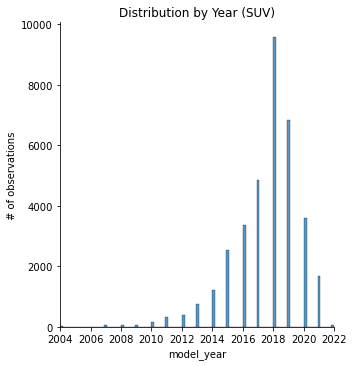

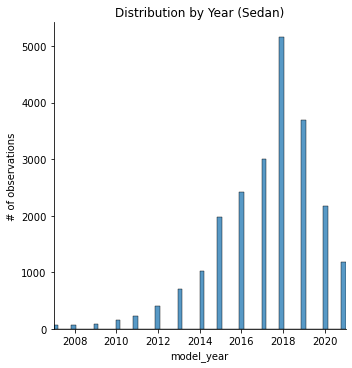

In [15]:
#n=30 as threshold
n = 30

#extract model_year where n_observations >= threshold
list_of_years_suv = []
for key in df_suv.groupby('model_year').size().keys():
    if df_suv.groupby('model_year').size()[key] >= n:
        list_of_years_suv.append(key)
        
list_of_years_sedan = []
for key in df_sedan.groupby('model_year').size().keys():
    if df_sedan.groupby('model_year').size()[key] >= n:
        list_of_years_sedan.append(key)
        
#filter dataframes on years we just extracted
df_suv = df_suv[df_suv['model_year'].isin(list_of_years_suv)]
df_sedan = df_sedan[df_sedan['model_year'].isin(list_of_years_sedan)]

#visualize new SUV distribution
sns.displot(x=df_suv['model_year']).set(
    title='Distribution by Year (SUV)', ylabel='# of observations', xlim=(df_suv['model_year'].min(),
                                                                          df_suv['model_year'].max()))
#visualize new Sedan distribution
sns.displot(x=df_sedan['model_year']).set(
    title='Distribution by Year (Sedan)', ylabel='# of observations', xlim=(df_sedan['model_year'].min(),
                                                                            df_sedan['model_year'].max()));

Graphs are left-skewed and can possibly be  be related to how these retailers purchase their inventory, or related to the 7-year time frame around extended warranties. Further research is required to understand why.

### `price`

Let's move onto `price` now and, similarly, view its distribution.

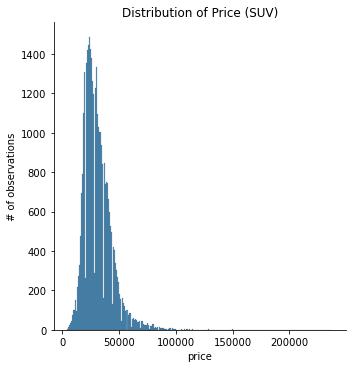

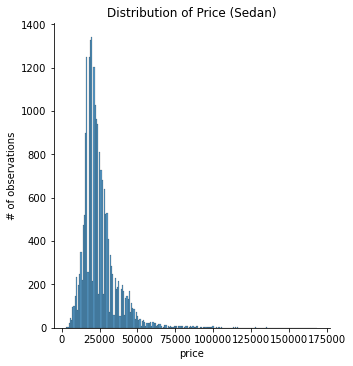

In [16]:
#visualize distribution of price
sns.displot(x=df_suv['price']).set(
    title='Distribution of Price (SUV)', ylabel='# of observations')
sns.displot(x=df_sedan['price']).set(
    title='Distribution of Price (Sedan)', ylabel='# of observations');

Outliers are definitely present. Let's narrow our data to capture the 0.5% - 99.5%tile. We could have also picked our threshold to be within 3 standard deviations of the mean.

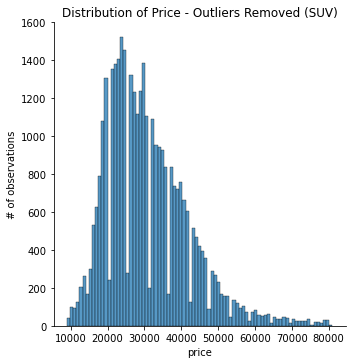

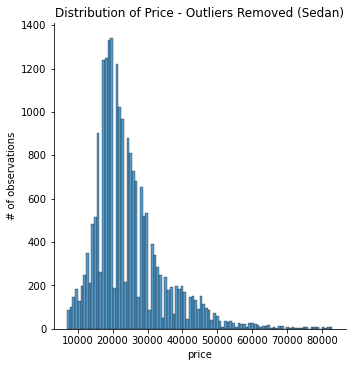

In [17]:
#outlier threshold
lb = .005
ub = .995

#remove outliers
df_suv = df_suv[(df_suv['price'] < df_suv['price'].quantile(ub)) &
                    (df_suv['price'] > df_suv['price'].quantile(lb))]
df_sedan = df_sedan[(df_sedan['price'] < df_sedan['price'].quantile(ub)) &
                    (df_sedan['price'] > df_sedan['price'].quantile(lb))]

sns.displot(x=df_suv['price']).set(title='Distribution of Price - Outliers Removed (SUV)', ylabel='# of observations')
sns.displot(x=df_sedan['price']).set(title='Distribution of Price - Outliers Removed (Sedan)', ylabel='# of observations');

Price is right-skewed. Let's be sure to look at medians as opposed to mean, when graphing.

### `mileage`

Now, let's apply what we did to `price` to `mileage`

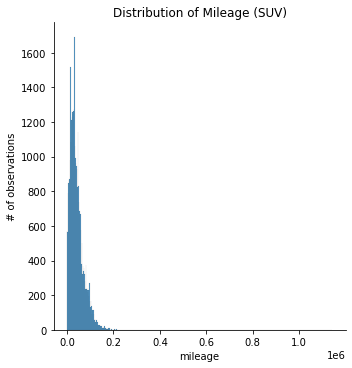

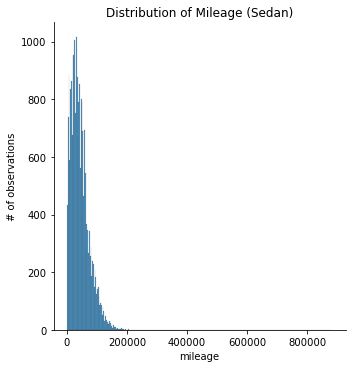

In [18]:
#visualize distribution of mileage
sns.displot(x=df_suv['mileage']).set(
    title='Distribution of Mileage (SUV)', ylabel='# of observations')
sns.displot(x=df_sedan['mileage']).set(
    title='Distribution of Mileage (Sedan)', ylabel='# of observations');

Narrow our data to capture the 0.5% - 99.5%tile.

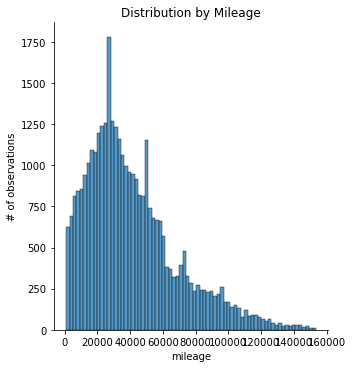

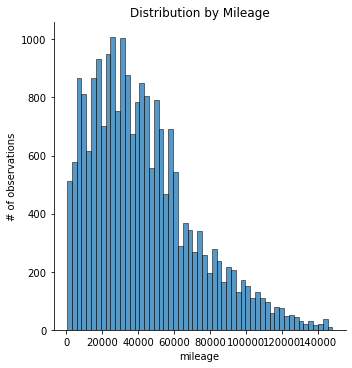

In [19]:
#remove outliers
df_suv = df_suv[(df_suv['mileage'] < df_suv['mileage'].quantile(ub)) &
                    (df_suv['mileage'] > df_suv['mileage'].quantile(lb))]
df_sedan = df_sedan[(df_sedan['mileage'] < df_sedan['mileage'].quantile(ub)) &
                    (df_sedan['mileage'] > df_sedan['mileage'].quantile(lb))]

sns.displot(x=df_suv['mileage']).set(title='Distribution by Mileage', ylabel='# of observations')
sns.displot(x=df_sedan['mileage']).set(title='Distribution by Mileage', ylabel='# of observations');

Similarly, mileage is right-skewed. Let's be sure to look at medians as opposed to mean, when graphing.

Let's combine our dataframes now that we've finished our data cleaning and drop any columns no longer needed.

In [20]:
#drop un-needed columns
df_suv.drop(['year_make', 'model_trim', 'state'], axis=1, inplace=True)
df_sedan.drop(['year_make', 'model_trim', 'state'], axis=1, inplace=True)

#combine cleaned dataframes
df = pd.concat([df_suv, df_sedan], ignore_index=True)
df

,price,mileage,retailer,car_type,model_year,manufacturer
0,37998.0,31000.0,carmax,suv,2019,acura
1,40998.0,22000.0,carmax,suv,2020,acura
2,38998.0,17000.0,carmax,suv,2020,acura
3,40998.0,17000.0,carmax,suv,2020,acura
4,27998.0,45000.0,carmax,suv,2015,acura
...,...,...,...,...,...,...
56810,32999.0,22502.0,sonic,sedan,2018,volvo
56811,32999.0,23096.0,sonic,sedan,2018,volvo
56812,30778.0,34944.0,sonic,sedan,2018,volvo
56813,30678.0,20792.0,sonic,sedan,2018,volvo


## Data Visualization

#### Inventory Distribution

Now that the data is in a better place, let's re-visualize how our data is distributed among the different retailers.

In [21]:
#sort colors to match future graphs
conditions = [(df_suv['retailer'] == 'autonation'), (df_suv['retailer'] == 'berkshire'),
              (df_suv['retailer'] == 'sonic'), (df_suv['retailer'] == 'carmax')]
choices = [0,1,2,3]
df_suv['order'] = np.select(conditions, choices)
df_suv = df_suv.sort_values(by='order')

conditions = [(df_sedan['retailer'] == 'autonation'), (df_sedan['retailer'] == 'berkshire'),
              (df_sedan['retailer'] == 'sonic'), (df_sedan['retailer'] == 'carmax')]
choices = [0,1,2,3]

df_sedan['order'] = np.select(conditions, choices)
df_sedan = df_sedan.sort_values(by='order')

In [22]:
fig1 = px.histogram(data_frame=df_suv, x='model_year', color='retailer', barmode='group', title='SUV Count by Model Year', 
                    labels={'model_year': 'Model Year'})
fig2 = px.histogram(data_frame=df_sedan, x='model_year', color='retailer', barmode='group', title='Sedan Count by Model Year', 
                    labels={'model_year': 'Model Year'}, range_y=(0,6000))

display(fig1, fig2)

#### 2022 model car exploration

It seems odd that there are used SUVs for 2022. However, according to [Edmund](https://www.edmunds.com/car-buying/when-to-buy-your-next-car.html): 
>"Vehicles for the next model year can debut as early as the spring of the current year. And some cars don't debut until the spring or summer of their model year. In other words, you'll see some 2022 vehicles for sale as early as the spring of 2021. Some 2022 models, meanwhile, won't show up in dealerships until halfway through 2021.

Let's be sure to define the `model_year` field to be [model year](https://www.valuepenguin.com/auto-insurance/car-make-model) of car in the write-up.

Let's do a bit more of investigation as to what types of cars these 2022 cars are. Could it be that these cars were bought by someone in early 2022 and sold several months later?

In [23]:
display(df_suv[df_suv['model_year'] == 2022]['manufacturer'].value_counts())
print(df_sedan[df_sedan['model_year'] == 2022]['manufacturer'].value_counts())

bmw           21
acura          7
hyundai        2
kia            2
mitsubishi     1
volkswagen     1
mini           1
Name: manufacturer, dtype: int64

Series([], Name: manufacturer, dtype: int64)


In [24]:
data1 = df_suv[df_suv['model_year'] == 2022].groupby('manufacturer').median()
data1['count'] = df_suv[df_suv['model_year'] == 2022].groupby('manufacturer').size()

fig = px.bar(data_frame=data1, x=data1.index, y='count', title='2022 Model Counts by Manufacturer (SUV)', text='mileage')

fig.update_traces(texttemplate='Mileage: %{text}', textposition='outside')
fig.show()

Of the 2022 cars, why are there so many BMWs? Although it's possible for someone to buy a 2022 model car in the spring and sell it during the summer, this would not explain why most of the cars were bmws. Could it be that there was a defect/recall in BMW's 2022 model cars? 

It could also be a pricing strategy to lower the cost without lowering [brand equity](https://www.investopedia.com/terms/b/brandequity.asp). BMWs are seen as a luxury brand, and since BMW doesn't want to lower it's brand equity, BMW could be incentivizing dealerships to purchase BMW loaner vechicles to increase mileage in order to lower the value of these cars, in order to capture more sales. Consumers will perceive purchasing these cars as a good deal since these cars will have less mileage on them, while the BMW brand equity is preserved. Further research is required to support this.

#### Price and Mileage

Now let's visualize how price and mileage change across car models and retailers for both SUV and sedans.

In [25]:
data = pd.DataFrame(
        df_suv.groupby(['model_year', 'retailer'])['price'].median().reset_index())
size = []

fig = px.scatter(data, x='model_year', y='price', color = 'retailer', title='Median Price vs. Model Year (SUV)')
fig.update_xaxes(title_text = 'Model Year')
fig.update_yaxes(title_text = 'Median Price ($)')

fig

In [26]:
data = pd.DataFrame(
        df_suv.groupby(['model_year', 'retailer'])['mileage'].median().reset_index())
size = []

fig = px.scatter(data, x='model_year', y='mileage', color = 'retailer', title='Median Mileage vs. Model Year (SUV)')
fig.update_xaxes(title_text = 'Model Year')
fig.update_yaxes(title_text = 'Median Mileage')

fig

In [27]:
data = pd.DataFrame(
        df_sedan.groupby(['model_year', 'retailer'])['price'].median().reset_index())
size = []

fig = px.scatter(data, x='model_year', y='price', color = 'retailer', title='Median Price vs. Model Year (Sedan)')
fig.update_xaxes(title_text = 'Year')
fig.update_yaxes(title_text = 'Median Price ($)')

fig

In [28]:
data = pd.DataFrame(
        df_sedan.groupby(['model_year', 'retailer'])['mileage'].median().reset_index())
size = []

fig = px.scatter(data, x='model_year', y='mileage', color = 'retailer', title='Median Mileage vs. Model Year (Sedan)')
fig.update_xaxes(title_text = 'Model Year')
fig.update_yaxes(title_text = 'Median Mileage')

fig

In [29]:
data = pd.DataFrame(
        df_sedan.groupby(['model_year', 'retailer'])['price'].median().reset_index())

fig = px.scatter(data[(data['model_year'] > 2014) & (data['model_year'] < 2021)], x='model_year', y='price', color = 'retailer', 
                 title='Median Price vs. Year (Sedan)')
fig.update_xaxes(title_text = 'Model Year')
fig.update_yaxes(title_text = 'Median Price ($)')

fig

Refer to write-up/exhibits for additional commentary.

#### Split by Manufacturer

This may be too granular of a split, but visualizing how price and mileage change across manufacturers is a possibility.

In [30]:
data = df_suv
df_input = df_suv.copy()

manufacturers = data['manufacturer'].unique().tolist()
years = sorted(data['model_year'].unique().tolist())

dfs = {}
for manufacturer in manufacturers:
    dfs[manufacturer]=pd.pivot_table(data[data['manufacturer']==manufacturer],
                                values='price',
                                index = 'model_year',
                                columns = 'retailer',
                                aggfunc=np.median)

# find row and column unions
common_cols = []
common_rows = []
for i in dfs.keys():
    common_cols = sorted(list(set().union(common_cols,list(dfs[i]))))
    common_rows = sorted(list(set().union(common_rows,list(dfs[i].index))))
    
# find dimensionally common dataframe
df_common = pd.DataFrame(np.nan, index=common_rows, columns=common_cols)

# reshape each dfs[df] into common dimensions
dfc={}
for df_item in dfs:
    #print(dfs[unshaped])
    df1 = dfs[df_item].copy()
    s=df_common.combine_first(df1)
    df_reshaped = df1.reindex_like(s)
    dfc[df_item]=df_reshaped
    
# plotly start 
fig = go.Figure()
# one trace for each column per dataframe
for col in common_cols:
    fig.add_trace(go.Scatter(x=years,
                             visible=True,
                             marker=dict(size=12, line=dict(width=2)),
                             marker_symbol = 'diamond',name=col)
             )

# menu setup    
updatemenu= []

# buttons for menu 1, names
buttons= []

# create traces for each color: 
# build argVals for buttons and create buttons
for i in dfc.keys():
    argList = []
    for col in dfc[i]:
#         print(dfc[i][col].values)
        argList.append(dfc[i][col].values)
    argVals = [{'y':argList}]

    buttons.append(dict(method='update',
                        label=i,
                        visible=True,
                        args=argVals))

# buttons for menu 2, colors
b2_labels = common_cols

# matrix to feed all visible arguments for all traces
# so that they can be shown or hidden by choice
b2_show = [list(b) for b in [e==1 for e in np.eye(len(b2_labels))]]
buttons2=[]
buttons2.append({'method': 'update',
                 'label': 'All',
                 'args': [{'visible': [True]*len(common_cols)}]})

# create buttons to show or hide
for i in range(0, len(b2_labels)):
    buttons2.append(dict(method='update',
                        label=b2_labels[i],
                        args=[{'visible':b2_show[i]}]
                        )
                   )

# add option for button two to hide all
buttons2.append(dict(method='update',
                        label='None',
                        args=[{'visible':[False]*len(common_cols)}]
                        )
                   )

# some adjustments to the updatemenus
updatemenu=[]
your_menu=dict()
updatemenu.append(your_menu)
your_menu2=dict()
updatemenu.append(your_menu2)
updatemenu[1]
updatemenu[0]['buttons']=buttons
updatemenu[0]['direction']='down'
updatemenu[0]['showactive']=True
updatemenu[1]['buttons']=buttons2
updatemenu[1]['y']=0.2

fig.update_layout(showlegend=False, updatemenus=updatemenu)
# fig.update_layout(yaxis=dict(range=[0,df_input['price'].mean()+0.4]))

# title
fig.update_layout(
    title=dict(
        text= "<i>Median Price vs. Year (SUV) with Manufacturer Filter</i>",
        font={'size':18},
        y=0.9,
        x=0.5,
        xanchor= 'center',
        yanchor= 'top'),
    yaxis=dict(
        title='Median Price ($)'),
    xaxis=dict(
        title='Model Year'))


# button annotations
fig.update_layout(
    annotations=[
        dict(text="<i>Manufacturer</i>", x=-0.2, xref="paper", y=1.1, yref="paper",
            align="left", showarrow=False, font = dict(size=16, color = 'steelblue')),
        dict(text="<i>Retailer</i>", x=-0.13, xref="paper", y=0.2, yref="paper",
            align="left", showarrow=False, font = dict(size=16, color = 'steelblue')),
    ])

fig.show()

#results are a bit funky at first... toggle a manufacturer to see accurate data points

In [31]:
data = df_suv
df_input = df_suv.copy()

manufacturers = data['manufacturer'].unique().tolist()
years = sorted(data['model_year'].unique().tolist())

dfs = {}
for manufacturer in manufacturers:
    dfs[manufacturer]=pd.pivot_table(data[data['manufacturer']==manufacturer],
                                values='mileage',
                                index = 'model_year',
                                columns = 'retailer',
                                aggfunc=np.median)

# find row and column unions
common_cols = []
common_rows = []
for i in dfs.keys():
    common_cols = sorted(list(set().union(common_cols,list(dfs[i]))))
    common_rows = sorted(list(set().union(common_rows,list(dfs[i].index))))
    
# find dimensionally common dataframe
df_common = pd.DataFrame(np.nan, index=common_rows, columns=common_cols)

# reshape each dfs[df] into common dimensions
dfc={}
for df_item in dfs:
    #print(dfs[unshaped])
    df1 = dfs[df_item].copy()
    s=df_common.combine_first(df1)
    df_reshaped = df1.reindex_like(s)
    dfc[df_item]=df_reshaped
    
# plotly start 
fig = go.Figure()
# one trace for each column per dataframe
for col in common_cols:
    fig.add_trace(go.Scatter(x=years,
                             visible=True,
                             marker=dict(size=12, line=dict(width=2)),
                             marker_symbol = 'diamond',name=col)
             )

# menu setup    
updatemenu= []

# buttons for menu 1, names
buttons= []

# create traces for each color: 
# build argVals for buttons and create buttons
for i in dfc.keys():
    argList = []
    for col in dfc[i]:
#         print(dfc[i][col].values)
        argList.append(dfc[i][col].values)
    argVals = [{'y':argList}]

    buttons.append(dict(method='update',
                        label=i,
                        visible=True,
                        args=argVals))

# buttons for menu 2, colors
b2_labels = common_cols

# matrix to feed all visible arguments for all traces
# so that they can be shown or hidden by choice
b2_show = [list(b) for b in [e==1 for e in np.eye(len(b2_labels))]]
buttons2=[]
buttons2.append({'method': 'update',
                 'label': 'All',
                 'args': [{'visible': [True]*len(common_cols)}]})

# create buttons to show or hide
for i in range(0, len(b2_labels)):
    buttons2.append(dict(method='update',
                        label=b2_labels[i],
                        args=[{'visible':b2_show[i]}]
                        )
                   )

# add option for button two to hide all
buttons2.append(dict(method='update',
                        label='None',
                        args=[{'visible':[False]*len(common_cols)}]
                        )
                   )

# some adjustments to the updatemenus
updatemenu=[]
your_menu=dict()
updatemenu.append(your_menu)
your_menu2=dict()
updatemenu.append(your_menu2)
updatemenu[1]
updatemenu[0]['buttons']=buttons
updatemenu[0]['direction']='down'
updatemenu[0]['showactive']=True
updatemenu[1]['buttons']=buttons2
updatemenu[1]['y']=0.2

fig.update_layout(showlegend=False, updatemenus=updatemenu)
# fig.update_layout(yaxis=dict(range=[0,df_input['price'].mean()+0.4]))

# title
fig.update_layout(
    title=dict(
        text= "<i>Median Mileage vs. Year (SUV) with Manufacturer Filter</i>",
        font={'size':18},
        y=0.9,
        x=0.5,
        xanchor= 'center',
        yanchor= 'top'),
    yaxis=dict(
        title='Median Mileage'),
    xaxis=dict(
        title='Model Year'))


# button annotations
fig.update_layout(
    annotations=[
        dict(text="<i>Manufacturer</i>", x=-0.2, xref="paper", y=1.1, yref="paper",
            align="left", showarrow=False, font = dict(size=16, color = 'steelblue')),
        dict(text="<i>Retailer</i>", x=-0.13, xref="paper", y=0.2, yref="paper",
            align="left", showarrow=False, font = dict(size=16, color = 'steelblue')),
    ])

fig.show()

#results are a bit funky at first... toggle a manufacturer to see accurate data points

In [32]:
data = df_sedan
df_input = df_sedan.copy()

manufacturers = data['manufacturer'].unique().tolist()
years = sorted(data['model_year'].unique().tolist())

dfs = {}
for manufacturer in manufacturers:
    dfs[manufacturer]=pd.pivot_table(data[data['manufacturer']==manufacturer],
                                values='price',
                                index = 'model_year',
                                columns = 'retailer',
                                aggfunc=np.median)

# find row and column unions
common_cols = []
common_rows = []
for i in dfs.keys():
    common_cols = sorted(list(set().union(common_cols,list(dfs[i]))))
    common_rows = sorted(list(set().union(common_rows,list(dfs[i].index))))
    
# find dimensionally common dataframe
df_common = pd.DataFrame(np.nan, index=common_rows, columns=common_cols)

# reshape each dfs[df] into common dimensions
dfc={}
for df_item in dfs:
    #print(dfs[unshaped])
    df1 = dfs[df_item].copy()
    s=df_common.combine_first(df1)
    df_reshaped = df1.reindex_like(s)
    dfc[df_item]=df_reshaped
    
# plotly start 
fig = go.Figure()
# one trace for each column per dataframe
for col in common_cols:
    fig.add_trace(go.Scatter(x=years,
                             visible=True,
                             marker=dict(size=12, line=dict(width=2)),
                             marker_symbol = 'diamond',name=col)
             )

# menu setup    
updatemenu= []

# buttons for menu 1, names
buttons= []

# create traces for each color: 
# build argVals for buttons and create buttons
for i in dfc.keys():
    argList = []
    for col in dfc[i]:
#         print(dfc[i][col].values)
        argList.append(dfc[i][col].values)
    argVals = [{'y':argList}]

    buttons.append(dict(method='update',
                        label=i,
                        visible=True,
                        args=argVals))

# buttons for menu 2, colors
b2_labels = common_cols

# matrix to feed all visible arguments for all traces
# so that they can be shown or hidden by choice
b2_show = [list(b) for b in [e==1 for e in np.eye(len(b2_labels))]]
buttons2=[]
buttons2.append({'method': 'update',
                 'label': 'All',
                 'args': [{'visible': [True]*len(common_cols)}]})

# create buttons to show or hide
for i in range(0, len(b2_labels)):
    buttons2.append(dict(method='update',
                        label=b2_labels[i],
                        args=[{'visible':b2_show[i]}]
                        )
                   )

# add option for button two to hide all
buttons2.append(dict(method='update',
                        label='None',
                        args=[{'visible':[False]*len(common_cols)}]
                        )
                   )

# some adjustments to the updatemenus
updatemenu=[]
your_menu=dict()
updatemenu.append(your_menu)
your_menu2=dict()
updatemenu.append(your_menu2)
updatemenu[1]
updatemenu[0]['buttons']=buttons
updatemenu[0]['direction']='down'
updatemenu[0]['showactive']=True
updatemenu[1]['buttons']=buttons2
updatemenu[1]['y']=0.2

fig.update_layout(showlegend=False, updatemenus=updatemenu)
# fig.update_layout(yaxis=dict(range=[0,df_input['price'].mean()+0.4]))

# title
fig.update_layout(
    title=dict(
        text= "<i>Median Price vs. Year (Sedan) with Manufacturer Filter</i>",
        font={'size':18},
        y=0.9,
        x=0.5,
        xanchor= 'center',
        yanchor= 'top'),
    yaxis=dict(
        title='Median Price ($)'),
    xaxis=dict(
        title='Model Year'))


# button annotations
fig.update_layout(
    annotations=[
        dict(text="<i>Manufacturer</i>", x=-0.2, xref="paper", y=1.1, yref="paper",
            align="left", showarrow=False, font = dict(size=16, color = 'steelblue')),
        dict(text="<i>Retailer</i>", x=-0.13, xref="paper", y=0.2, yref="paper",
            align="left", showarrow=False, font = dict(size=16, color = 'steelblue')),
    ])

fig.show()

#results are a bit funky at first... toggle a manufacturer to see accurate data points

In [33]:
data = df_sedan
df_input = df_sedan.copy()

manufacturers = data['manufacturer'].unique().tolist()
years = sorted(data['model_year'].unique().tolist())

dfs = {}
for manufacturer in manufacturers:
    dfs[manufacturer]=pd.pivot_table(data[data['manufacturer']==manufacturer],
                                values='mileage',
                                index = 'model_year',
                                columns = 'retailer',
                                aggfunc=np.median)

# find row and column unions
common_cols = []
common_rows = []
for i in dfs.keys():
    common_cols = sorted(list(set().union(common_cols,list(dfs[i]))))
    common_rows = sorted(list(set().union(common_rows,list(dfs[i].index))))
    
# find dimensionally common dataframe
df_common = pd.DataFrame(np.nan, index=common_rows, columns=common_cols)

# reshape each dfs[df] into common dimensions
dfc={}
for df_item in dfs:
    #print(dfs[unshaped])
    df1 = dfs[df_item].copy()
    s=df_common.combine_first(df1)
    df_reshaped = df1.reindex_like(s)
    dfc[df_item]=df_reshaped
    
# plotly start 
fig = go.Figure()
# one trace for each column per dataframe
for col in common_cols:
    fig.add_trace(go.Scatter(x=years,
                             visible=True,
                             marker=dict(size=12, line=dict(width=2)),
                             marker_symbol = 'diamond',name=col)
             )

# menu setup    
updatemenu= []

# buttons for menu 1, names
buttons= []

# create traces for each color: 
# build argVals for buttons and create buttons
for i in dfc.keys():
    argList = []
    for col in dfc[i]:
#         print(dfc[i][col].values)
        argList.append(dfc[i][col].values)
    argVals = [{'y':argList}]

    buttons.append(dict(method='update',
                        label=i,
                        visible=True,
                        args=argVals))

# buttons for menu 2, colors
b2_labels = common_cols

# matrix to feed all visible arguments for all traces
# so that they can be shown or hidden by choice
b2_show = [list(b) for b in [e==1 for e in np.eye(len(b2_labels))]]
buttons2=[]
buttons2.append({'method': 'update',
                 'label': 'All',
                 'args': [{'visible': [True]*len(common_cols)}]})

# create buttons to show or hide
for i in range(0, len(b2_labels)):
    buttons2.append(dict(method='update',
                        label=b2_labels[i],
                        args=[{'visible':b2_show[i]}]
                        )
                   )

# add option for button two to hide all
buttons2.append(dict(method='update',
                        label='None',
                        args=[{'visible':[False]*len(common_cols)}]
                        )
                   )

# some adjustments to the updatemenus
updatemenu=[]
your_menu=dict()
updatemenu.append(your_menu)
your_menu2=dict()
updatemenu.append(your_menu2)
updatemenu[1]
updatemenu[0]['buttons']=buttons
updatemenu[0]['direction']='down'
updatemenu[0]['showactive']=True
updatemenu[1]['buttons']=buttons2
updatemenu[1]['y']=0.2

fig.update_layout(showlegend=False, updatemenus=updatemenu)
# fig.update_layout(yaxis=dict(range=[0,df_input['price'].mean()+0.4]))

# title
fig.update_layout(
    title=dict(
        text= "<i>Median Mileage vs. Year (Sedan) with Manufacturer Filter</i>",
        font={'size':18},
        y=0.9,
        x=0.5,
        xanchor= 'center',
        yanchor= 'top'),
    yaxis=dict(
        title='Median Mileage'),
    xaxis=dict(
        title='Model Year'))


# button annotations
fig.update_layout(
    annotations=[
        dict(text="<i>Manufacturer</i>", x=-0.2, xref="paper", y=1.1, yref="paper",
            align="left", showarrow=False, font = dict(size=16, color = 'steelblue')),
        dict(text="<i>Retailer</i>", x=-0.13, xref="paper", y=0.2, yref="paper",
            align="left", showarrow=False, font = dict(size=16, color = 'steelblue')),
    ])

fig.show()

#results are a bit funky at first... toggle a manufacturer to see accurate data points

#### What is dispersion in this context?

Let's visualize how price and mileage change between `model_year`.

In [34]:
df_suv_max = df_suv.groupby(['model_year', 'retailer'])['price'].median().reset_index().groupby(['model_year']).max().drop(
    ['retailer'], axis=1).rename({'price': 'max_price'}, axis=1)
df_suv_min = df_suv.groupby(['model_year', 'retailer'])['price'].median().reset_index().groupby(['model_year']).min().drop(
    ['retailer'], axis=1).rename({'price': 'min_price'}, axis=1)

df_dispersion = pd.concat([df_suv_max, df_suv_min], axis=1)
df_dispersion['difference'] = df_dispersion['max_price'] - df_dispersion['min_price']

data = df_dispersion[(df_dispersion.index > 2014) & (df_dispersion.index < 2021)]

fig = px.line(data, x=data.index, y='difference', title='Price Dispersion (SUV)')
fig.update_xaxes(title_text = 'Model Year', autorange="reversed")
fig.update_yaxes(title_text = 'Range of Price ($)')

fig

In [35]:
df_suv_max = df_suv.groupby(['model_year', 'retailer'])['mileage'].median().reset_index().groupby(['model_year']).max().drop(
    ['retailer'], axis=1).rename({'mileage': 'max_mileage'}, axis=1)
df_suv_min = df_suv.groupby(['model_year', 'retailer'])['mileage'].median().reset_index().groupby(['model_year']).min().drop(
    ['retailer'], axis=1).rename({'mileage': 'min_mileage'}, axis=1)

df_dispersion = pd.concat([df_suv_max, df_suv_min], axis=1)
df_dispersion['difference'] = df_dispersion['max_mileage'] - df_dispersion['min_mileage']

data = df_dispersion[(df_dispersion.index > 2014) & (df_dispersion.index < 2021)]

fig = px.line(data, x=data.index, y='difference', title='Mileage Dispersion (SUV)')
fig.update_xaxes(title_text = 'Model Year', autorange="reversed")
fig.update_yaxes(title_text = 'Range of Mileage')

fig

In [36]:
df_sedan_max = df_sedan.groupby(['model_year', 'retailer'])['price'].median().reset_index().groupby(['model_year']).max().drop(
    ['retailer'], axis=1).rename({'price': 'max_price'}, axis=1)
df_sedan_min = df_sedan.groupby(['model_year', 'retailer'])['price'].median().reset_index().groupby(['model_year']).min().drop(
    ['retailer'], axis=1).rename({'price': 'min_price'}, axis=1)

df_dispersion = pd.concat([df_sedan_max, df_sedan_min], axis=1)
df_dispersion['difference'] = df_dispersion['max_price'] - df_dispersion['min_price']

data = df_dispersion[(df_dispersion.index > 2014) & (df_dispersion.index < 2021)]

fig = px.line(data, x=data.index, y='difference', title='Price Dispersion (Sedan)')
fig.update_xaxes(title_text = 'Model Year', autorange="reversed")
fig.update_yaxes(title_text = 'Range of Price ($)')

fig

In [37]:
df_sedan_max = df_sedan.groupby(['model_year', 'retailer'])['mileage'].median().reset_index().groupby(['model_year']).max().drop(
    ['retailer'], axis=1).rename({'mileage': 'max_mileage'}, axis=1)
df_sedan_min = df_sedan.groupby(['model_year', 'retailer'])['mileage'].median().reset_index().groupby(['model_year']).min().drop(
    ['retailer'], axis=1).rename({'mileage': 'min_mileage'}, axis=1)

df_dispersion = pd.concat([df_sedan_max, df_sedan_min], axis=1)
df_dispersion['difference'] = df_dispersion['max_mileage'] - df_dispersion['min_mileage']

data = df_dispersion[(df_dispersion.index > 2014) & (df_dispersion.index < 2021)]

fig = px.line(data, x=data.index, y='difference', title='Mileage Dispersion (Sedan)')
fig.update_xaxes(title_text = 'Model Year', autorange="reversed")
fig.update_yaxes(title_text = 'Range of Mileage')

fig

Looking at just SUVs, mileage dispersion decreases year to year, while price dispersion dips in 2017 before increasing through 2020. <br>

Because there are so many factors that contribute to pricing, most likely specific to each retailer, let's evaluate price dispersion through linear regression. Let's construct industry confidence intervals for each variable, then compare them to the confidence intervals for retailer-specific regression results.


## Modeling

Before we model, let's make sure we have enough data for each `model_year`.

In [38]:
#preview combined data distribution by model_year
df['model_year'].value_counts().sort_index()

2004        4
2007       45
2008       71
2009       97
2010      250
2011      472
2012      744
2013     1398
2014     2220
2015     4500
2016     5763
2017     7850
2018    14695
2019    10466
2020     5622
2021     2583
2022       35
Name: model_year, dtype: int64

In [39]:
#lets narrow down our data where model_year has 1000 or more
threshold = 1000
df = df[df.groupby('model_year')['price'].transform('count') >= threshold ]
df['model_year'].value_counts().sort_index()

2013     1398
2014     2220
2015     4500
2016     5763
2017     7850
2018    14695
2019    10466
2020     5622
2021     2583
Name: model_year, dtype: int64

### Step-by-step One-Hot Encoding

As mentioned before, `manufacturer` will not be included in the regression as a variable, due to high cardinality and time constraints. <br>

However, as an aside, below is some code addressing the high cardinality issue by limiting `manufacturer` to top 20 and then dummying the variable.

In [40]:
#show top 20 manufacturers
top20 = df['manufacturer'].value_counts()[:20]
display(top20)

toyota           6899
jeep             4861
honda            4756
ford             3915
nissan           3770
bmw              3365
chevrolet        3363
lexus            2698
mercedes-benz    2629
hyundai          2434
kia              1929
subaru           1927
dodge            1387
mazda            1327
volkswagen       1276
gmc              1208
audi             1131
acura             932
infiniti          852
cadillac          840
Name: manufacturer, dtype: int64

In [41]:
#categorize non-top 20 manufacturers as 'other'
top20 = top20.keys()
df.loc[~df["manufacturer"].isin(top20), "manufacturer"] = "other"

df['manufacturer'].value_counts()

C:\Users\17178\anaconda3\envs\learn-env\lib\site-packages\pandas\core\indexing.py:1765: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



toyota           6899
jeep             4861
honda            4756
ford             3915
nissan           3770
other            3598
bmw              3365
chevrolet        3363
lexus            2698
mercedes-benz    2629
hyundai          2434
kia              1929
subaru           1927
dodge            1387
mazda            1327
volkswagen       1276
gmc              1208
audi             1131
acura             932
infiniti          852
cadillac          840
Name: manufacturer, dtype: int64

In [42]:
#Separating our categorical and continuous variables
categorical = ['retailer', 'car_type', 'model_year'] #manufacturer has not been included for conciseness
continuous = ['price', 'mileage']

# dummy our categorical variables
df_dummies = pd.concat([pd.get_dummies(df[i], drop_first=True) for i in categorical], axis=1) #avoid dummy variable trap
df_regression = pd.concat([df[continuous], df_dummies], axis=1)
df_regression

,price,mileage,berkshire,carmax,sonic,suv,2014,2015,2016,2017,2018,2019,2020,2021
0,37998.0,31000.0,0,1,0,1,0,0,0,0,0,1,0,0
1,40998.0,22000.0,0,1,0,1,0,0,0,0,0,0,1,0
2,38998.0,17000.0,0,1,0,1,0,0,0,0,0,0,1,0
3,40998.0,17000.0,0,1,0,1,0,0,0,0,0,0,1,0
4,27998.0,45000.0,0,1,0,1,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56810,32999.0,22502.0,0,0,1,0,0,0,0,0,1,0,0,0
56811,32999.0,23096.0,0,0,1,0,0,0,0,0,1,0,0,0
56812,30778.0,34944.0,0,0,1,0,0,0,0,0,1,0,0,0
56813,30678.0,20792.0,0,0,1,0,0,0,0,0,1,0,0,0


Back to linear regression. Now let's scale our coefficients down by a factor of 1,000 to help with interpretation.

In [43]:
#help in the interpretation in our coefficients
df['price'] = df['price'].div(1000)
df['mileage'] = df['mileage'].div(1000)

<ipython-input-43-8d25e5653023>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-43-8d25e5653023>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### Linear Regression

Please note that the dummy variable trap has been avoided by dropping 1 category for each categorical variable. I.e., the case of perfect multicollinearity (perfect linear relationship among dummies variables) has been removed. This will help interpret our coefficients in the future regression models. [Reference](https://www.learndatasci.com/glossary/dummy-variable-trap/) <br>

Industry and Retailer specific results were summarized in [Google Sheets](https://docs.google.com/spreadsheets/d/1ZbF0V01EQcexm0WV5Nu6aArQ9L8xZ23WdbnvnAv4_A0/).

#### Industry Wide Pricing Regression

In [44]:
df_regression = df

#Separating our categorical and continuous variables
categorical = ['car_type', 'model_year']
continuous = ['price', 'mileage']

# dummy our categorical variables
df_dummies = pd.concat([pd.get_dummies(df_regression[i], drop_first=True) for i in categorical]
                       , axis=1) #avoid dummy variable trap
df_regression = pd.concat([df_regression[continuous], df_dummies], axis=1)
df_regression

#declare X and y. no train/test split, since the focus is not on generalizing on new data.
y = df_regression['price']
X = df_regression.drop('price', axis=1)

#no need to scale variables since mileage is the only continuous variable

#add constant
X = sm.add_constant(X)

model = sm.OLS(y, X).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.305
Model:                            OLS   Adj. R-squared:                  0.305
Method:                 Least Squares   F-statistic:                     2420.
Date:                Sun, 22 Aug 2021   Prob (F-statistic):               0.00
Time:                        14:51:05   Log-Likelihood:            -2.0147e+05
No. Observations:               55097   AIC:                         4.030e+05
Df Residuals:                   55086   BIC:                         4.031e+05
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         23.3593      0.305     76.525      0.000      22.761      23.958
mileage       -0.1023      0.002    -49.478      0.000      -0.106      -0.098
suv            5.9229      0.082     71.810      0.000       5.761       6.085
2014           1.2201      0.320      3.811      0.000       0.593       1.848
2015           2.8176      0.289      9.743      0.000       2.251       3.384
2016           3.3448      0.284     11.776      0.000       2.788       3.901
2017           4.6044      0.281     16.402      0.000       4.054       5.155
2018           6.2892      0.280     22.436      0.000       5.740       6.839
2019           6.7255      0.290     23.176      0.000       6.157       7.294
2020           9.8162      0.312     31.428      0.000       9.204      10.428
2021          16.6799      0.349     47.794      0.000      15.996      17.364
==============================================================================
Omnibus:                    16066.540   Durbin-Watson:                   0.918
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            50986.456
Skew:                           1.496   Prob(JB):                         0.00
Kurtosis:                       6.642   Cond. No.                         989.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

#### Assumptions for Linear Regression

In [45]:
#remove constant before testing assumptions
df_regression = df

#Separating our categorical and continuous variables
categorical = ['car_type', 'model_year']
continuous = ['price', 'mileage']

# dummy our categorical variables
df_dummies = pd.concat([pd.get_dummies(df_regression[i], drop_first=True) for i in categorical]
                       , axis=1) #avoid dummy variable trap
df_regression = pd.concat([df_regression[continuous], df_dummies], axis=1)
df_regression

y = df_regression['price']
X = df_regression.drop('price', axis=1)

# add constant <---
# X = sm.add_constant(X) <---

model = sm.OLS(y, X).fit()

Code taken from: https://jeffmacaluso.github.io/post/LinearRegressionAssumptions/

Linearity: The relationship between X and the mean of Y is linear. <br>
Homoscedasticity : The variance of residual is the same for any value of X. <br>
Independence (No Multicollinearity among Predictors): Observations are independent of each other. <br>
Normality (Normality of Error Terms): For any fixed value of X, Y is normally distributed. <br>

##### Linearity

In [46]:
#linearity
px.scatter(df_regression, x='mileage', y='price', trendline='ols', trendline_color_override='red')

Since data points do not closely follow the red line, a linear regression fitting may not be the best model choice, as it might not be able to efficiently explain the data in terms of variability/prediction accuracy.

##### Normality of Residuals

In [47]:
#setup visualization of residual
def calculate_residuals(model, features, label):
    """
    Creates predictions on the features with the model and calculates residuals
    """
    predictions = model.predict(features)
    df_results = pd.DataFrame({'Actual': label, 'Predicted': predictions})
    df_results['Residuals'] = abs(df_results['Actual']) - abs(df_results['Predicted'])
    
    return df_results

def normal_errors_assumption(model, features, label, p_value_thresh=0.05):
    """
    Normality: Assumes that the error terms are normally distributed. If they are not,
    nonlinear transformations of variables may solve this.
               
    This assumption being violated primarily causes issues with the confidence intervals
    """
    from statsmodels.stats.diagnostic import normal_ad
    print('Assumption 2: The error terms are normally distributed', '\n')
    
    # Calculating residuals for the Anderson-Darling test
    df_results = calculate_residuals(model, features, label)
    
    print('Using the Anderson-Darling test for normal distribution')

    # Performing the test on the residuals
    p_value = normal_ad(df_results['Residuals'])[1]
    print('p-value from the test - below 0.05 generally means non-normal:', p_value)
    
    # Reporting the normality of the residuals
    if p_value < p_value_thresh:
        print('Residuals are not normally distributed')
    else:
        print('Residuals are normally distributed')
    
    # Plotting the residuals distribution
    plt.subplots(figsize=(12, 6))
    plt.title('Distribution of Residuals')
    sns.distplot(df_results['Residuals'])
    plt.show()
    
    print()
    if p_value > p_value_thresh:
        print('Assumption satisfied')
    else:
        print('Assumption not satisfied')
        print()
        print('Confidence intervals will likely be affected')
        print('Try performing nonlinear transformations on variables')

Assumption 2: The error terms are normally distributed 

Using the Anderson-Darling test for normal distribution
p-value from the test - below 0.05 generally means non-normal: 0.0
Residuals are not normally distributed


C:\Users\17178\anaconda3\envs\learn-env\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



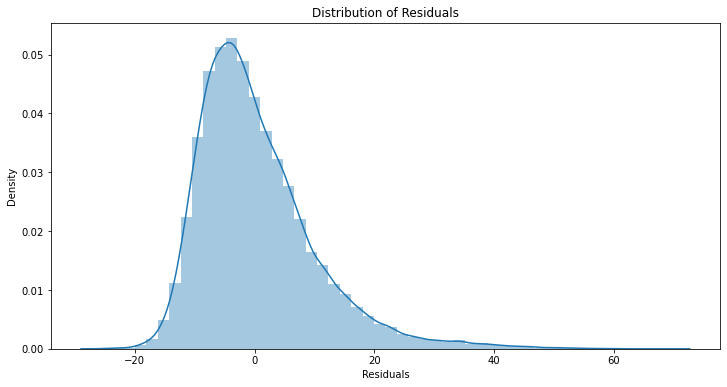


Assumption not satisfied

Confidence intervals will likely be affected
Try performing nonlinear transformations on variables


In [48]:
normal_errors_assumption(model, X, y)

##### Independence

In [49]:
def multicollinearity_assumption(model, features, label, feature_names=None):
    """
    Multicollinearity: Assumes that predictors are not correlated with each other. If there is
                       correlation among the predictors, then either remove prepdictors with high
                       Variance Inflation Factor (VIF) values or perform dimensionality reduction
                           
                       This assumption being violated causes issues with interpretability of the 
                       coefficients and the standard errors of the coefficients.
    """
    from statsmodels.stats.outliers_influence import variance_inflation_factor
    print('Assumption 3: Little to no multicollinearity among predictors')
        
    # Plotting the heatmap
    plt.figure(figsize = (10,8))
    sns.heatmap(pd.DataFrame(features).corr(), annot=True)
    plt.title('Correlation of Variables')
    plt.show()
        
    print('Variance Inflation Factors (VIF)')
    print('> 10: An indication that multicollinearity may be present')
    print('> 100: Certain multicollinearity among the variables')
    print('-------------------------------------')
       
    # Gathering the VIF for each variable
    VIF = [variance_inflation_factor(features.values, i) for i in range(X.columns.size)]
    for idx, vif in enumerate(VIF):
        print('{0}: {1}'.format(X.columns[idx], vif))
        
    # Gathering and printing total cases of possible or definite multicollinearity
    possible_multicollinearity = sum([1 for vif in VIF if vif > 10])
    definite_multicollinearity = sum([1 for vif in VIF if vif > 100])
    print()
    print('{0} cases of possible multicollinearity'.format(possible_multicollinearity))
    print('{0} cases of definite multicollinearity'.format(definite_multicollinearity))
    print()

    if definite_multicollinearity == 0:
        if possible_multicollinearity == 0:
            print('Assumption satisfied')
        else:
            print('Assumption possibly satisfied')
            print()
            print('Coefficient interpretability may be problematic')
            print('Consider removing variables with a high Variance Inflation Factor (VIF)')

    else:
        print('Assumption not satisfied')
        print()
        print('Coefficient interpretability will be problematic')
        print('Consider removing variables with a high Variance Inflation Factor (VIF)')

Assumption 3: Little to no multicollinearity among predictors


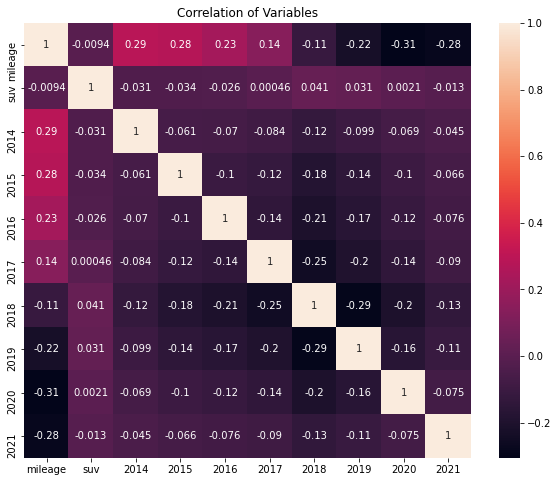

Variance Inflation Factors (VIF)
> 10: An indication that multicollinearity may be present
> 100: Certain multicollinearity among the variables
-------------------------------------
mileage: 4.368225328555871
suv: 2.5985519169344666
2014: 1.4670109342306132
2015: 1.6932661823212114
2016: 1.727680138631136
2017: 1.7811385975010718
2018: 1.9536911334114462
2019: 1.5341691026330797
2020: 1.1911835925442142
2021: 1.0682966095033546

0 cases of possible multicollinearity
0 cases of definite multicollinearity

Assumption satisfied


In [50]:
linear_feature_names = ['X'+str(feature+1) for feature in range(X.columns.size)]

multicollinearity_assumption(model, X, y, feature_names=linear_feature_names)

##### No residual autocorrelation

In [51]:
def autocorrelation_assumption(model, features, label):
    """
    Autocorrelation: Assumes that there is no autocorrelation in the residuals. If there is
                     autocorrelation, then there is a pattern that is not explained due to
                     the current value being dependent on the previous value.
                     This may be resolved by adding a lag variable of either the dependent
                     variable or some of the predictors.
    """
    from statsmodels.stats.stattools import durbin_watson
    print('Assumption 4: No Autocorrelation', '\n')
    
    # Calculating residuals for the Durbin Watson-tests
    df_results = calculate_residuals(model, features, label)

    print('\nPerforming Durbin-Watson Test')
    print('Values of 1.5 < d < 2.5 generally show that there is no autocorrelation in the data')
    print('0 to 2< is positive autocorrelation')
    print('>2 to 4 is negative autocorrelation')
    print('-------------------------------------')
    durbinWatson = durbin_watson(df_results['Residuals'])
    print('Durbin-Watson:', durbinWatson)
    if durbinWatson < 1.5:
        print('Signs of positive autocorrelation', '\n')
        print('Assumption not satisfied')
    elif durbinWatson > 2.5:
        print('Signs of negative autocorrelation', '\n')
        print('Assumption not satisfied')
    else:
        print('Little to no autocorrelation', '\n')
        print('Assumption satisfied')

In [52]:
autocorrelation_assumption(model, X, y)

Assumption 4: No Autocorrelation 


Performing Durbin-Watson Test
Values of 1.5 < d < 2.5 generally show that there is no autocorrelation in the data
0 to 2< is positive autocorrelation
>2 to 4 is negative autocorrelation
-------------------------------------
Durbin-Watson: 0.9576080466727903
Signs of positive autocorrelation 

Assumption not satisfied


##### Homoscedasticity of Residuals

C:\Users\17178\anaconda3\envs\learn-env\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



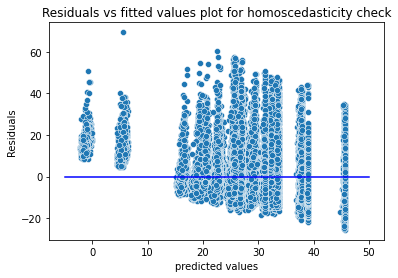

In [53]:
y_hat = model.predict(X)
residuals = y.values-y_hat

p = sns.scatterplot(x=y_hat, y=residuals)
plt.xlabel('predicted values')
plt.ylabel('Residuals')
p = sns.lineplot([-5,50],[0,0],color='blue')
p = plt.title('Residuals vs fitted values plot for homoscedasticity check');

In [54]:
name = ['F statistic', 'p-value']
test = sms.het_goldfeldquandt(residuals, X)
lzip(name, test)

[('F statistic', 0.9856316846950967), ('p-value', 0.885090063609141)]

In the interest of time, will assume all conditions for linear regression have been met, and are met for any further regressions. Let's continue with retailer-specific regression.

#### CarMax Pricing Regression

In [55]:
df_regression = df[df['retailer'] == 'carmax']

#Separating our categorical and continuous variables
categorical = ['car_type', 'model_year']
continuous = ['price', 'mileage']

# dummy our categorical variables
df_dummies = pd.concat([pd.get_dummies(df_regression[i], drop_first=True) for i in categorical]
                       , axis=1) #avoid dummy variable trap
df_regression = pd.concat([df_regression[continuous], df_dummies], axis=1)
df_regression

y = df_regression['price']
X = df_regression.drop('price', axis=1)

#no need to scale variables since mileage is the only continuous variable

#add constant
X = sm.add_constant(X)

model = sm.OLS(y, X).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.274
Model:                            OLS   Adj. R-squared:                  0.274
Method:                 Least Squares   F-statistic:                     1222.
Date:                Sun, 22 Aug 2021   Prob (F-statistic):               0.00
Time:                        14:51:10   Log-Likelihood:            -1.1642e+05
No. Observations:               32403   AIC:                         2.329e+05
Df Residuals:                   32392   BIC:                         2.330e+05
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         23.3125      0.403     57.853      0.000      22.523      24.102
mileage       -0.0900      0.003    -30.552      0.000      -0.096      -0.084
suv            6.0557      0.102     59.621      0.000       5.857       6.255
2014           0.7005      0.436      1.606      0.108      -0.154       1.555
2015           2.4004      0.384      6.248      0.000       1.647       3.153
2016           2.6001      0.376      6.920      0.000       1.864       3.337
2017           3.6262      0.373      9.729      0.000       2.896       4.357
2018           4.9168      0.373     13.184      0.000       4.186       5.648
2019           5.5614      0.385     14.456      0.000       4.807       6.315
2020           9.4666      0.410     23.096      0.000       8.663      10.270
2021          14.6748      0.472     31.061      0.000      13.749      15.601
==============================================================================
Omnibus:                     9643.436   Durbin-Watson:                   1.078
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            32150.315
Skew:                           1.506   Prob(JB):                         0.00
Kurtosis:                       6.839   Cond. No.                         960.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Let's investigate why 2014 `model_year` has a high p-value. Could it be that there is a low sample size for Carmax, or is there a healthy number of instances there whose mean price are not distinguishable from the 2013 price?

In [56]:
df[(df['retailer'] == 'carmax')&((df['model_year'] == 2014) |(df['model_year'] == 2013))]['model_year'].value_counts()

2014    1065
2013     658
Name: model_year, dtype: int64

Looks to be the mean 2013 price is not distinguishable from the mean 2013 price.

#### AutoNation Pricing Regression

In [57]:
df_regression = df[df['retailer'] == 'autonation']

#Separating our categorical and continuous variables
categorical = ['car_type', 'model_year']
continuous = ['price', 'mileage']

# dummy our categorical variables
df_dummies = pd.concat([pd.get_dummies(df_regression[i], drop_first=True) for i in categorical]
                       , axis=1) #avoid dummy variable trap
df_regression = pd.concat([df_regression[continuous], df_dummies], axis=1)
df_regression

y = df_regression['price']
X = df_regression.drop('price', axis=1)

#no need to scale variables since mileage is the only continuous variable

#add constant
X = sm.add_constant(X)

model = sm.OLS(y, X).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.379
Model:                            OLS   Adj. R-squared:                  0.378
Method:                 Least Squares   F-statistic:                     792.1
Date:                Sun, 22 Aug 2021   Prob (F-statistic):               0.00
Time:                        14:51:10   Log-Likelihood:                -48482.
No. Observations:               12994   AIC:                         9.699e+04
Df Residuals:                   12983   BIC:                         9.707e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         24.4686      0.577     42.392      0.000      23.337      25.600
mileage       -0.1212      0.004    -29.778      0.000      -0.129      -0.113
suv            5.8866      0.182     32.401      0.000       5.530       6.243
2014           1.9619      0.553      3.546      0.000       0.878       3.046
2015           2.9792      0.521      5.721      0.000       1.958       4.000
2016           3.9208      0.520      7.540      0.000       2.902       4.940
2017           5.8049      0.517     11.235      0.000       4.792       6.818
2018           7.5148      0.517     14.547      0.000       6.502       8.527
2019           8.0951      0.546     14.833      0.000       7.025       9.165
2020          10.5835      0.609     17.389      0.000       9.390      11.776
2021          17.8490      0.652     27.372      0.000      16.571      19.127
==============================================================================
Omnibus:                     3359.904   Durbin-Watson:                   1.128
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             8993.936
Skew:                           1.387   Prob(JB):                         0.00
Kurtosis:                       5.987   Cond. No.                         967.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

#### Berkshire Pricing Regression

In [58]:
df_regression = df[df['retailer'] == 'berkshire']

#Separating our categorical and continuous variables
categorical = ['car_type', 'model_year']
continuous = ['price', 'mileage']

# dummy our categorical variables
df_dummies = pd.concat([pd.get_dummies(df_regression[i], drop_first=True) for i in categorical]
                       , axis=1) #avoid dummy variable trap
df_regression = pd.concat([df_regression[continuous], df_dummies], axis=1)
df_regression

y = df_regression['price']
X = df_regression.drop('price', axis=1)

#no need to scale variables since mileage is the only continuous variable

#add constant
X = sm.add_constant(X)

model = sm.OLS(y, X).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.324
Model:                            OLS   Adj. R-squared:                  0.323
Method:                 Least Squares   F-statistic:                     236.6
Date:                Sun, 22 Aug 2021   Prob (F-statistic):               0.00
Time:                        14:51:10   Log-Likelihood:                -17766.
No. Observations:                4950   AIC:                         3.555e+04
Df Residuals:                    4939   BIC:                         3.563e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         22.2759      1.109     20.095      0.000      20.103      24.449
mileage       -0.1085      0.006    -17.367      0.000      -0.121      -0.096
suv            7.2761      0.258     28.217      0.000       6.771       7.782
2014           0.2491      1.164      0.214      0.831      -2.033       2.531
2015           2.7189      1.057      2.571      0.010       0.646       4.792
2016           2.8132      1.045      2.691      0.007       0.764       4.862
2017           4.7170      1.009      4.673      0.000       2.738       6.696
2018           6.0362      1.010      5.975      0.000       4.056       8.017
2019           5.9409      1.030      5.767      0.000       3.921       7.960
2020           7.7054      1.086      7.092      0.000       5.576       9.835
2021          13.1699      1.226     10.739      0.000      10.766      15.574
==============================================================================
Omnibus:                     1149.056   Durbin-Watson:                   0.202
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2784.671
Skew:                           1.279   Prob(JB):                         0.00
Kurtosis:                       5.637   Cond. No.                     1.28e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.28e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [59]:
df[(df['retailer'] == 'berkshire')&((df['model_year'] == 2014) |(df['model_year'] == 2013))]['model_year'].value_counts()

2014    155
2013     90
Name: model_year, dtype: int64

#### Sonic Pricing Regression

In [60]:
df_regression = df[df['retailer'] == 'sonic']

#Separating our categorical and continuous variables
categorical = ['car_type', 'model_year']
continuous = ['price', 'mileage']

# dummy our categorical variables
df_dummies = pd.concat([pd.get_dummies(df_regression[i], drop_first=True) for i in categorical]
                       , axis=1) #avoid dummy variable trap
df_regression = pd.concat([df_regression[continuous], df_dummies], axis=1)
df_regression

y = df_regression['price']
X = df_regression.drop('price', axis=1)

#no need to scale variables since mileage is the only continuous variable

#add constant
X = sm.add_constant(X)

model = sm.OLS(y, X).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.303
Model:                            OLS   Adj. R-squared:                  0.301
Method:                 Least Squares   F-statistic:                     205.8
Date:                Sun, 22 Aug 2021   Prob (F-statistic):               0.00
Time:                        14:51:11   Log-Likelihood:                -18014.
No. Observations:                4750   AIC:                         3.605e+04
Df Residuals:                    4739   BIC:                         3.612e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         23.3194      1.359     17.157      0.000      20.655      25.984
mileage       -0.1096      0.009    -12.378      0.000      -0.127      -0.092
suv            4.7078      0.321     14.665      0.000       4.078       5.337
2014           1.0140      1.390      0.730      0.466      -1.710       3.738
2015           2.8680      1.292      2.220      0.026       0.336       5.400
2016           5.4821      1.257      4.360      0.000       3.017       7.947
2017           6.2720      1.225      5.120      0.000       3.870       8.674
2018           9.9089      1.226      8.083      0.000       7.506      12.312
2019          10.1405      1.268      7.994      0.000       7.654      12.627
2020          11.8741      1.375      8.633      0.000       9.178      14.570
2021          20.1107      1.446     13.906      0.000      17.275      22.946
==============================================================================
Omnibus:                     1381.347   Durbin-Watson:                   0.312
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3915.942
Skew:                           1.529   Prob(JB):                         0.00
Kurtosis:                       6.231   Cond. No.                     1.10e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.1e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [61]:
df[(df['retailer'] == 'sonic')&((df['model_year'] == 2014) |(df['model_year'] == 2013))]['model_year'].value_counts()

2014    152
2013     99
Name: model_year, dtype: int64

#### Include Manufacturer into Industry Pricing Regression

In [62]:
df_regression = df

#Separating our categorical and continuous variables
categorical = ['car_type', 'model_year', 'manufacturer']
continuous = ['price', 'mileage']

# dummy our categorical variables
df_dummies = pd.concat([pd.get_dummies(df_regression[i], drop_first=True) for i in categorical]
                       , axis=1) #avoid dummy variable trap
df_regression = pd.concat([df_regression[continuous], df_dummies], axis=1)
df_regression

y = df_regression['price']
X = df_regression.drop('price', axis=1)

#no need to scale variables since mileage is the only continuous variable

#add constant
X = sm.add_constant(X)

model = sm.OLS(y, X).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.476
Model:                            OLS   Adj. R-squared:                  0.476
Method:                 Least Squares   F-statistic:                     1666.
Date:                Sun, 22 Aug 2021   Prob (F-statistic):               0.00
Time:                        14:51:11   Log-Likelihood:            -1.9371e+05
No. Observations:               55097   AIC:                         3.875e+05
Df Residuals:                   55066   BIC:                         3.878e+05
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const            22.8000      0.377     60.523      0.000      22.062      23.538
mileage          -0.0801      0.002    -44.048      0.000      -0.084      -0.077
suv               5.8126      0.076     76.436      0.000       5.664       5.962
2014              0.9535      0.278      3.424      0.001       0.408       1.499
2015              2.7093      0.252     10.767      0.000       2.216       3.202
2016              3.9634      0.247     16.031      0.000       3.479       4.448
2017              5.5314      0.244     22.629      0.000       5.052       6.010
2018              7.0368      0.244     28.819      0.000       6.558       7.515
2019              8.3472      0.253     32.983      0.000       7.851       8.843
2020             11.7712      0.272     43.202      0.000      11.237      12.305
2021             15.7340      0.307     51.272      0.000      15.133      16.335
audi              5.7209      0.361     15.844      0.000       5.013       6.429
bmw               6.0894      0.304     20.055      0.000       5.494       6.685
cadillac          8.1329      0.388     20.949      0.000       7.372       8.894
chevrolet        -2.4029      0.302     -7.951      0.000      -2.995      -1.811
dodge             1.3144      0.346      3.803      0.000       0.637       1.992
ford             -3.5888      0.298    -12.041      0.000      -4.173      -3.005
gmc               3.0894      0.357      8.645      0.000       2.389       3.790
honda            -4.1672      0.292    -14.252      0.000      -4.740      -3.594
hyundai          -7.8104      0.314    -24.865      0.000      -8.426      -7.195
infiniti          2.4315      0.387      6.287      0.000       1.673       3.190
jeep             -1.9925      0.294     -6.783      0.000      -2.568      -1.417
kia              -7.1531      0.325    -22.010      0.000      -7.790      -6.516
lexus             5.5077      0.310     17.773      0.000       4.900       6.115
mazda            -6.0573      0.349    -17.346      0.000      -6.742      -5.373
mercedes-benz     7.2987      0.311     23.451      0.000       6.689       7.909
nissan           -6.9344      0.299    -23.216      0.000      -7.520      -6.349
other             4.1838      0.300     13.933      0.000       3.595       4.772
subaru           -3.9045      0.325    -11.998      0.000      -4.542      -3.267
toyota           -2.5639      0.284     -9.013      0.000      -3.121      -2.006
volkswagen       -5.9080      0.351    -16.811      0.000      -6.597      -5.219
==============================================================================
Omnibus:                    15009.093   Durbin-Watson:                   1.229
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            49724.983
Skew:                           1.376   Prob(JB):         